In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import tensorflow_hub as hub

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


### Problem Statement
To build an image classifier using a deep learning algorithm to classify cassava images into four disease categories or a fifth category indicating a healthy leaf. With this, farmers will be able to quickly identify diseased plants by taking images of their crops with mobile-quality cameras to quickly identify diseased plants, potentially saving their crops before they inflict irreparable damage.

In [2]:
import cv2
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from sklearn.utils import class_weight

import json
import math
from datetime import datetime

from sklearn.metrics import accuracy_score, roc_auc_score, classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split, StratifiedKFold

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, models, callbacks, optimizers, applications, experimental, losses, utils 

# import keras
# from keras.layers import Input#, Dropout, Dense, MaxPooling2D, ZeroPadding2D, Conv2D, Flatten

# tf.keras.mixed_precision.set_global_policy('mixed_float16')

import warnings
warnings.simplefilter("ignore")
import absl.logging
absl.logging.set_verbosity(absl.logging.ERROR)

In [3]:
os.listdir('/kaggle/input/cassava-leaf-disease-classification')

['train_tfrecords',
 'sample_submission.csv',
 'test_tfrecords',
 'label_num_to_disease_map.json',
 'train_images',
 'train.csv',
 'test_images']

In [4]:
print("There are", len(os.listdir('/kaggle/input/cassava-leaf-disease-classification/train_images')), "images in this dataset")

There are 21397 images in this dataset


In [5]:
with open('/kaggle/input/cassava-leaf-disease-classification/label_num_to_disease_map.json') as file:
    disease_class = json.loads(file.read())
    print(json.dumps(disease_class, indent=2))

{
  "0": "Cassava Bacterial Blight (CBB)",
  "1": "Cassava Brown Streak Disease (CBSD)",
  "2": "Cassava Green Mottle (CGM)",
  "3": "Cassava Mosaic Disease (CMD)",
  "4": "Healthy"
}


In [6]:
df_train = pd.read_csv('/kaggle/input/cassava-leaf-disease-classification/train.csv')
df_train.head()

,image_id,label
0,1000015157.jpg,0
1,1000201771.jpg,3
2,100042118.jpg,1
3,1000723321.jpg,1
4,1000812911.jpg,3


In [7]:
# Including the class names in the data
df_train['class'] = df_train['label'].map({int(i) : c for i, c in disease_class.items()}) 
df_train.head()

,image_id,label,class
0,1000015157.jpg,0,Cassava Bacterial Blight (CBB)
1,1000201771.jpg,3,Cassava Mosaic Disease (CMD)
2,100042118.jpg,1,Cassava Brown Streak Disease (CBSD)
3,1000723321.jpg,1,Cassava Brown Streak Disease (CBSD)
4,1000812911.jpg,3,Cassava Mosaic Disease (CMD)


In [8]:
df_train['class'].value_counts().to_frame().reset_index()

,index,class
0,Cassava Mosaic Disease (CMD),13158
1,Healthy,2577
2,Cassava Green Mottle (CGM),2386
3,Cassava Brown Streak Disease (CBSD),2189
4,Cassava Bacterial Blight (CBB),1087


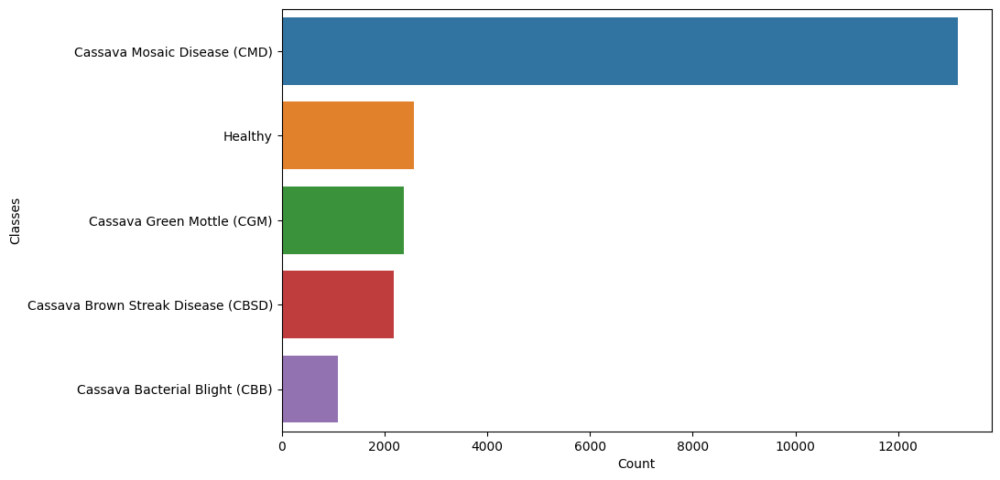

In [9]:
plt.figure(figsize=(10, 6))

sns.barplot(x='class', y='index', data=df_train['class'].value_counts().to_frame().reset_index())
plt.xlabel('Count')
plt.ylabel('Classes')
plt.show()

In [10]:
np.round((df_train['class'].value_counts() / len(df_train['class'])) * 100, 2)

Cassava Mosaic Disease (CMD)           61.49
Healthy                                12.04
Cassava Green Mottle (CGM)             11.15
Cassava Brown Streak Disease (CBSD)    10.23
Cassava Bacterial Blight (CBB)          5.08
Name: class, dtype: float64

We see that there is a heavy class imbalance in the dataset with class 3 (Cassava Mosaic Disease (CMD)) have]ing 61% of the dataset while class 0 (Cassava Bacterial Blight (CBB)) has only 5% of the dataset.

We should explore ways to balance this dataset

### Exploratory Data Analysis

In [11]:
path = "/kaggle/input/cassava-leaf-disease-classification"

In [12]:
def plot(images, labels, predictions = None):
    n_cols = min(3, len(images))
    n_rows = math.ceil(len(images) / n_cols)
    fig, axes = plt.subplots(n_rows, n_cols, figsize = (21,16))

    if predictions is None:
              
        predictions = [None] * len(labels)


    for i, (x, y_true, y_pred) in enumerate(zip(images, labels, predictions)):
        
        ax = axes.flat[i]
        a = plt.imread(os.path.join(path,"train_images", x ))
        ax.imshow(a)

        
        ax.set_title(f"Class: {y_true}")
             
        if y_pred is not None:
            ax.set_xlabel(f"Pred: {y_pred}", color='blue', fontweight='bold')

        ax.set_xticks([])
        ax.set_yticks([])

#### Samples of "0": "Cassava Bacterial Blight (CBB)"

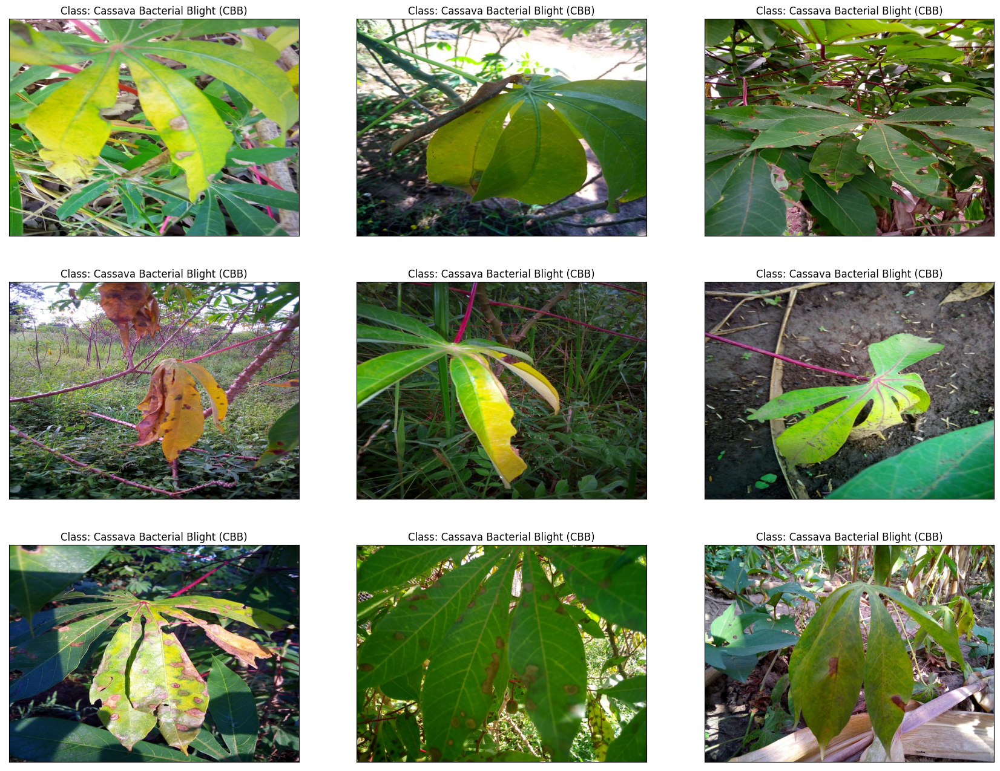

In [13]:
df_0 = df_train[df_train['label']==0]
df_0 = df_0.sample(9)
df_0_id = df_0['image_id'].values
df_0_class = df_0['class'].values

plot(df_0_id, df_0_class)

#### Samples of "1": "Cassava Brown Streak Disease (CBSD)"

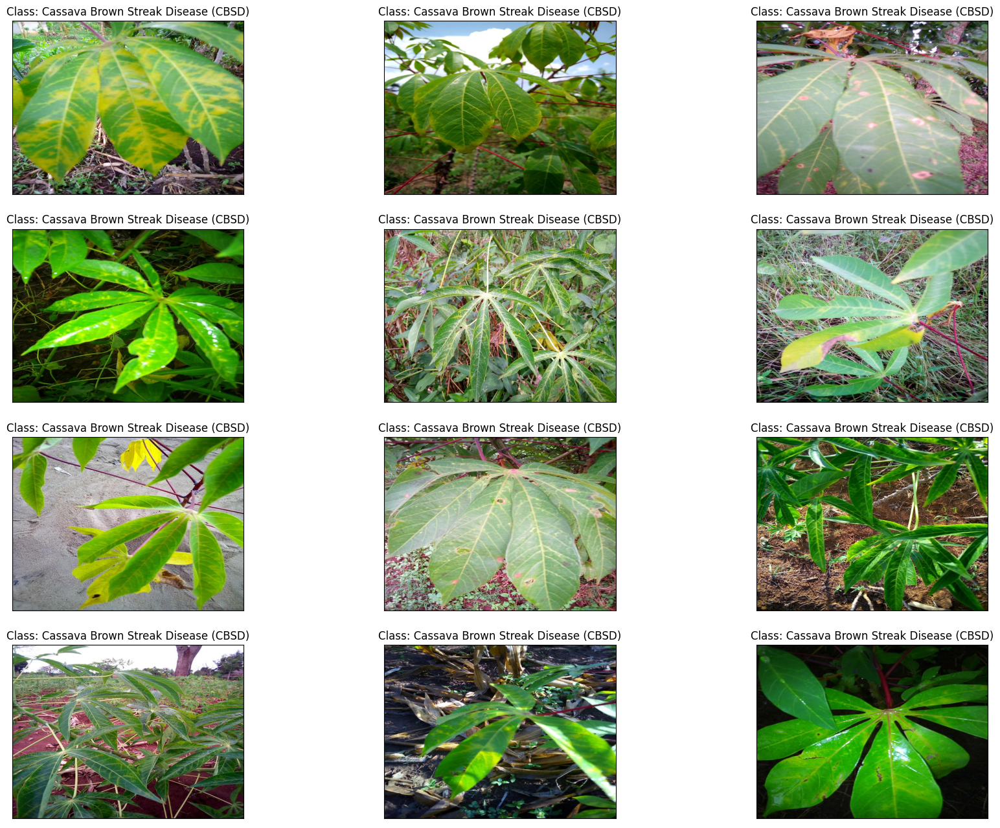

In [14]:
df_1 = df_train[df_train['label']==1]
df_1 = df_1.sample(12)
df_1_id = df_1['image_id'].values
df_1_class = df_1['class'].values

plot(df_1_id, df_1_class)

#### Samples of "2": "Cassava Green Mottle (CGM)"

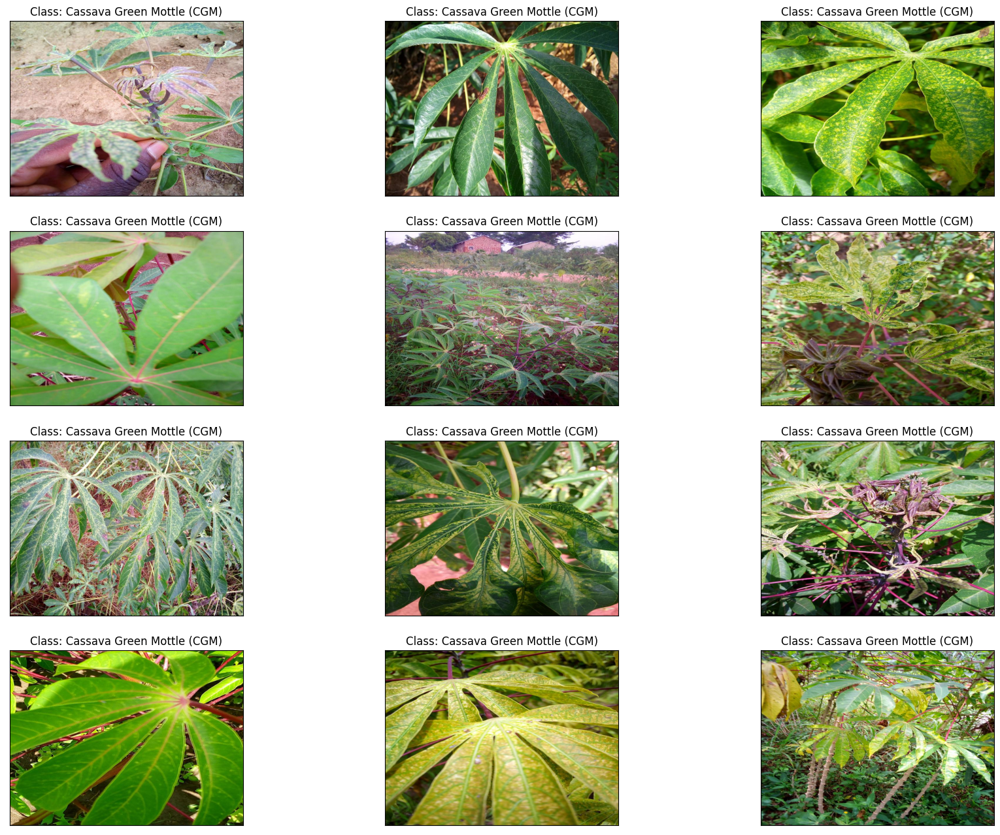

In [15]:
df_2 = df_train[df_train['label']==2]
df_2 = df_2.sample(12)
df_2_id = df_2['image_id'].values
df_2_class = df_2['class'].values

plot(df_2_id, df_2_class)

#### Samples of "3": "Cassava Mosaic Disease (CMD)"

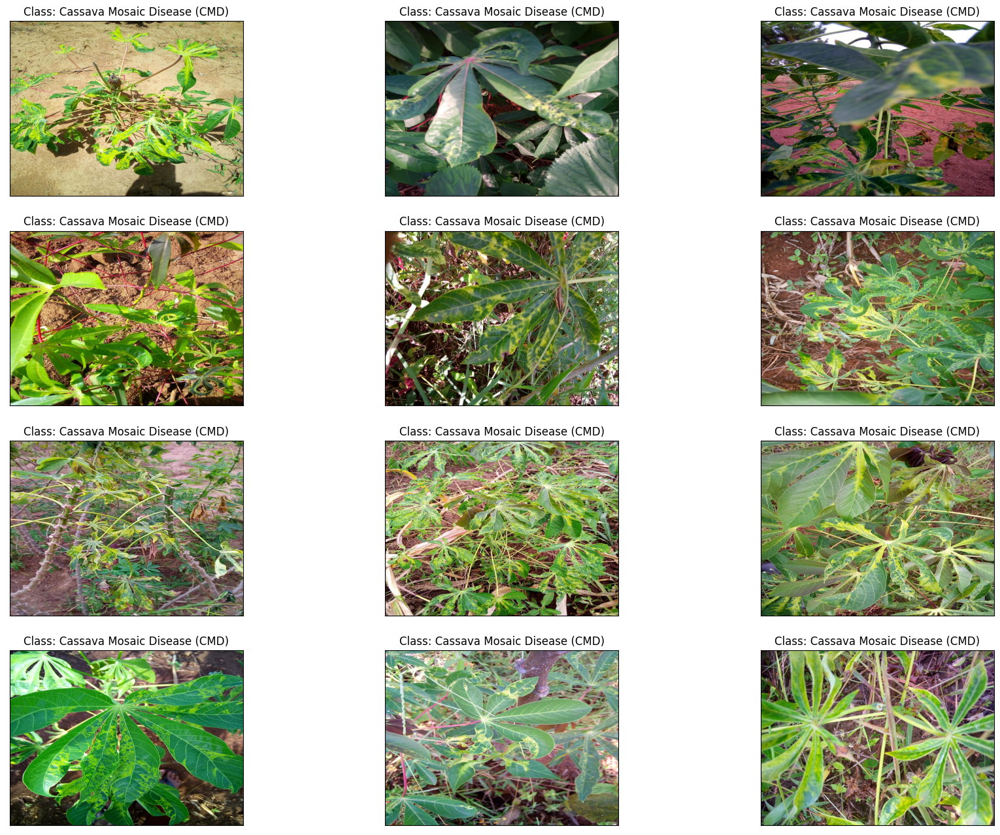

In [16]:
df_3 = df_train[df_train['label']==3]
df_3 = df_3.sample(12)
df_3_id = df_3['image_id'].values
df_3_class = df_3['class'].values

plot(df_3_id, df_3_class)

#### Samples of "4": "Healthy"

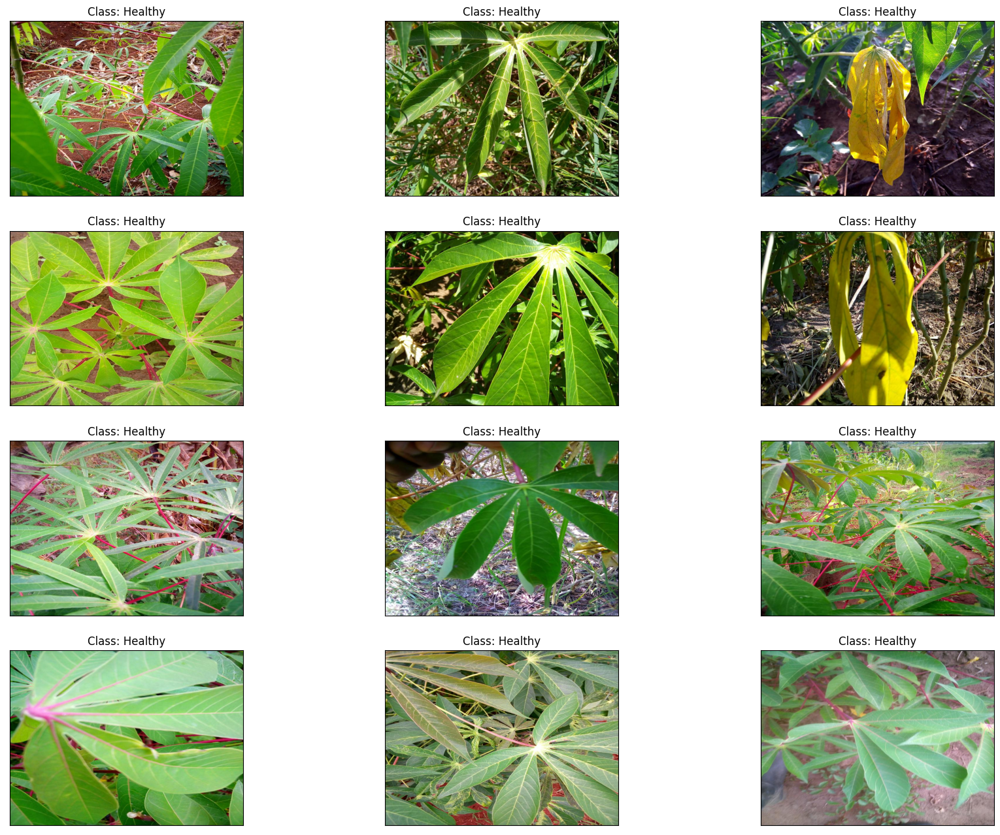

In [17]:
df_4 = df_train[df_train['label']==4]
df_4 = df_4.sample(12)
df_4_id = df_4['image_id'].values
df_4_class = df_4['class'].values

plot(df_4_id, df_4_class)

### Baseline Accuracy 

In [18]:
y_pred = [3] * len(df_train.label)
print("The baseline accuracy is {}".format(accuracy_score(y_pred, df_train.label)))

The baseline accuracy is 0.6149460204701593


### Handling Class Imbalance Using KFold Validation and ImageDataGenerator

In [19]:
def create_folds(df_train, n_split):
    df_train.loc[:, "kfold"] = -1
    df_train = df_train.sample(frac=1).reset_index(drop=True)
    SS = StratifiedKFold(n_splits=n_split)
    y = df_train.label.values
    for fold, (t_,v_) in enumerate((SS.split(X=df_train,y=y))):
        df_train.loc[v_, "kfold"] = fold
    return df_train

In [20]:
df_train['label'] = df_train['label'].astype('str')

In [21]:
df_train = create_folds(df_train, 5)
df_train.head(5)

,image_id,label,class,kfold
0,3287098987.jpg,3,Cassava Mosaic Disease (CMD),0
1,167313296.jpg,0,Cassava Bacterial Blight (CBB),0
2,3370446446.jpg,1,Cassava Brown Streak Disease (CBSD),0
3,1203285369.jpg,3,Cassava Mosaic Disease (CMD),0
4,2576198771.jpg,3,Cassava Mosaic Disease (CMD),0


In [22]:
df_train['kfold'].value_counts()

0    4280
1    4280
2    4279
3    4279
4    4279
Name: kfold, dtype: int64

### Apply Data Transforms and Specify Data Loaders

In [23]:
train_dir = '/kaggle/input/cassava-leaf-disease-classification/train_images'

def data_generator(train, validation , batch_size, img_rows, img_cols):
        
        train_datagen = ImageDataGenerator(rescale=1./225,
                           rotation_range=40,
                           width_shift_range=0.2,
                           height_shift_range=0.2,
                           shear_range=0.2,
                           zoom_range=0.2,
                           horizontal_flip=True,)
        
        validation_datagen = ImageDataGenerator(rescale=1./255,)
        
        train_gen = train_datagen.flow_from_dataframe(train,
                                                    train_dir,
                                                    x_col = 'image_id',
                                                    y_col = 'label',
                                                    target_size=(img_rows, img_cols),
                                                    seed = 42,
                                                    batch_size=batch_size,
                                                    class_mode='categorical',
                                                    interpolation = 'nearest',
                                                    shuffle=True)

        validation_gen = validation_datagen.flow_from_dataframe(validation,
                                                    train_dir,
                                                    x_col = 'image_id',
                                                    y_col = 'label',
                                                    target_size=(img_rows, img_cols),
                                                    seed = 42,
                                                    batch_size=batch_size,
                                                    class_mode='categorical',
                                                    interpolation = 'nearest',
                                                    shuffle=False)
        
        return train_gen, validation_gen

#### Transfer Learning

##### ResNet Model Architecture

In [24]:
"""def create_model():

    # import model
    restnet101 = applications.ResNet101V2(include_top = False, weights = 'imagenet', input_tensor = keras.Input(shape=(224, 224, 3)))
    # freeze some convolution blocks
    for layer in restnet101.layers[:-13]: 
        layer.trainable = False
    # check frozen layers
#     for i, layer in enumerate(restnet101.layers):
#         print(i, layer.name, layer.trainable)
    
    # define inputs
    inputs = layers.Input(shape=(224, 224, 3))
    # call the base model on x
    x = restnet101(inputs)


    # Fine-tuning
      # Combos
    x = layers.GlobalAveragePooling2D(name="avg_pool")(x)
    x = layers.Dense(256, activation = "relu")(x)
    x = layers.Dense(256, activation = "relu")(x)
    x = layers.Dropout(0.2)(x)
    x = layers.ReLU()(x)
    # Output layer - output dimension=5 because we have 5 classes
    outputs = layers.Dense(5, activation="softmax", name="pred")(x)

    # Put the model together
    model = keras.Model(inputs, outputs, name="EfficientNet")
    # Compile
    model.compile(optimizer='adam', loss = "categorical_crossentropy", metrics = ["accuracy"]) 
 
    return model"""

'def create_model():\n\n    # import model\n    restnet101 = applications.ResNet101V2(include_top = False, weights = \'imagenet\', input_tensor = keras.Input(shape=(224, 224, 3)))\n    # freeze some convolution blocks\n    for layer in restnet101.layers[:-13]: \n        layer.trainable = False\n    # check frozen layers\n#     for i, layer in enumerate(restnet101.layers):\n#         print(i, layer.name, layer.trainable)\n    \n    # define inputs\n    inputs = layers.Input(shape=(224, 224, 3))\n    # call the base model on x\n    x = restnet101(inputs)\n\n\n    # Fine-tuning\n      # Combos\n    x = layers.GlobalAveragePooling2D(name="avg_pool")(x)\n    x = layers.Dense(256, activation = "relu")(x)\n    x = layers.Dense(256, activation = "relu")(x)\n    x = layers.Dropout(0.2)(x)\n    x = layers.ReLU()(x)\n    # Output layer - output dimension=5 because we have 5 classes\n    outputs = layers.Dense(5, activation="softmax", name="pred")(x)\n\n    # Put the model together\n    model = ke

In [25]:
# resnet_model = create_model()
# resnet_model.summary()

In [26]:
"""
def train_model(df, batch_size, img_rows, img_cols, fold, model):
    
    t1_1 = datetime.now()
    
    train = df[df.kfold != fold].reset_index(drop=True)
    validation = df[df.kfold == fold].reset_index(drop=True)
    
    train_generator, validation_generator = data_generator(train, validation, batch_size, img_rows, img_cols)
    
    callback_list = [callbacks.EarlyStopping(monitor='val_accuracy',patience=3, mode='max', restore_best_weights=True),
                    callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, mode='min'),
                    callbacks.ModelCheckpoint(filepath=f'model{fold}.hdf5', save_best_only = True, monitor = 'val_loss', mode = 'min', verbose = 1)]
      
    history = model.fit(train_generator, validation_data=validation_generator, callbacks=callback_list, epochs=10)
    
    return model, history, train_generator, validation_generator
"""

"\ndef train_model(df, batch_size, img_rows, img_cols, fold, model):\n    \n    t1_1 = datetime.now()\n    \n    train = df[df.kfold != fold].reset_index(drop=True)\n    validation = df[df.kfold == fold].reset_index(drop=True)\n    \n    train_generator, validation_generator = data_generator(train, validation, batch_size, img_rows, img_cols)\n    \n    callback_list = [callbacks.EarlyStopping(monitor='val_accuracy',patience=3, mode='max', restore_best_weights=True),\n                    callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, mode='min'),\n                    callbacks.ModelCheckpoint(filepath=f'model{fold}.hdf5', save_best_only = True, monitor = 'val_loss', mode = 'min', verbose = 1)]\n      \n    history = model.fit(train_generator, validation_data=validation_generator, callbacks=callback_list, epochs=10)\n    \n    return model, history, train_generator, validation_generator\n"

In [27]:
"""resnet_oof_acc=[]
resnet_oof_val_acc=[]
resnet_oof_loss=[]
resnet_oof_val_loss=[]
resnet_model_time = []

for i in range(5):
    
    t1_1 = datetime.now()
    
    print(25*"-")    
    print(f'{i}-fold training')
    print(25*"-")

    resnet_model, history, train_generator, validation_generator = train_model(df_train, 32, 224, 224, i, resnet_model)

    train_accuracy = history.history['accuracy']
    val_accuracy = history.history['val_accuracy']
    train_loss = history.history['loss']
    val_loss = history.history['val_loss']

    resnet_oof_acc.append(train_accuracy)
    resnet_oof_val_acc.append(val_accuracy)
    resnet_oof_loss.append(train_loss)
    resnet_oof_val_loss.append(val_loss)


    epochs = range(1, len(train_accuracy) + 1)
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
    fig.set_size_inches(20,10)

    ax1.plot(epochs , train_accuracy , 'go-' , label = 'Training Accuracy')
    ax1.plot(epochs , val_accuracy , 'ro-' , label = 'Validation Accuracy')
    ax1.set_title('Training & Validation Accuracy')
    ax1.legend()
    ax1.set_xlabel("Epochs")
    ax1.set_ylabel("Accuracy")

    ax2.plot(epochs , train_loss , 'g-o' , label = 'Training Loss')
    ax2.plot(epochs , val_loss , 'r-o' , label = 'Validation Loss')
    ax2.set_title('Testing Accuracy & Loss')
    ax2.legend()
    ax2.set_xlabel("Epochs")
    ax2.set_ylabel("Training & Validation Loss")

    fig.tight_layout()
    plt.show()
     
    t2_1 = datetime.now()
    resnet_model_time.append(str(t2_1 - t1_1))
    print("Model computation time: " + str(t2_1 - t1_1))"""

'resnet_oof_acc=[]\nresnet_oof_val_acc=[]\nresnet_oof_loss=[]\nresnet_oof_val_loss=[]\nresnet_model_time = []\n\nfor i in range(5):\n    \n    t1_1 = datetime.now()\n    \n    print(25*"-")    \n    print(f\'{i}-fold training\')\n    print(25*"-")\n\n    resnet_model, history, train_generator, validation_generator = train_model(df_train, 32, 224, 224, i, resnet_model)\n\n    train_accuracy = history.history[\'accuracy\']\n    val_accuracy = history.history[\'val_accuracy\']\n    train_loss = history.history[\'loss\']\n    val_loss = history.history[\'val_loss\']\n\n    resnet_oof_acc.append(train_accuracy)\n    resnet_oof_val_acc.append(val_accuracy)\n    resnet_oof_loss.append(train_loss)\n    resnet_oof_val_loss.append(val_loss)\n\n\n    epochs = range(1, len(train_accuracy) + 1)\n    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))\n    fig.set_size_inches(20,10)\n\n    ax1.plot(epochs , train_accuracy , \'go-\' , label = \'Training Accuracy\')\n    ax1.plot(epochs , val_accura

In [28]:
# resnet_acc_average = [sum(sub_list) / len(sub_list) for sub_list in resnet_oof_acc]
# resnet_val_acc_average = [sum(sub_list) / len(sub_list) for sub_list in resnet_oof_val_acc]
# resnet_loss_average = [sum(sub_list) / len(sub_list) for sub_list in resnet_oof_loss]
# resnet_val_loss_average = [sum(sub_list) / len(sub_list) for sub_list in resnet_oof_val_loss]

In [29]:
# print("Average training accuracy across 5 folds with ten epochs each -", resnet_acc_average)
# print("Average validation accuracy across 5 folds with ten epochs each -", resnet_val_acc_average)
# print("Average training loss across 5 folds with ten epochs each -", resnet_loss_average)
# print("Average validation loss across 5 folds with ten epochs each -", resnet_val_loss_average)

In [30]:
# resnet_model_time

In [31]:
# print("KFold Validation Accuracy: ", np.hstack(resnet_oof_acc).mean())

In [32]:
# Y_pred = resnet_model.predict_generator(validation_generator)
# y_pred = np.argmax(Y_pred, axis=1)
# print('Classification Report')
# target_names = list(train_generator.class_indices.keys()) # Classes
# print(classification_report(validation_generator.classes, y_pred, target_names=target_names))

In [33]:
# cm = confusion_matrix(validation_generator.classes, y_pred)
# labels = ['Cassava Bacterial Blight (CBB)', 'Cassava Brown Streak Disease (CBSD)', 'Cassava Green Mottle (CGM)', 'Cassava Mosaic Disease (CMD)','Healthy']
# plt.figure(figsize=(8,6))
# sns.heatmap(cm,xticklabels=labels, yticklabels=labels, annot=True, fmt='d', cmap="Blues", vmin = 0.2);
# plt.title('Confusion Matrix')
# plt.ylabel('True Class')
# plt.xlabel('Predicted Class')
# plt.show()

In [34]:
# pred = pd.DataFrame(y_pred, columns=['class_pred'])
# pred['pred'] = pred['class_pred'].map({int(i) : c for i, c in disease_class.items()})

In [35]:
# validation = df_train[df_train.kfold == 4].reset_index(drop=True)

# image_ids_test = validation["image_id"].values
# labels_test = validation["class"].values
# pred_result = pred['pred'].values

In [36]:
# rand_idxs = np.random.permutation(len(validation))[:9]

In [37]:
# plot(image_ids_test[rand_idxs], labels_test[rand_idxs], pred_result[rand_idxs])
# plt.show()

#### Model Prediction

In [38]:
sample = pd.read_csv("/kaggle/input/cassava-leaf-disease-classification/sample_submission.csv")
sample

,image_id,label
0,2216849948.jpg,4


In [39]:
resnet_model = tf.keras.models.load_model("/kaggle/input/resnet-model/model4.hdf5")

In [40]:
preds = []

for image in sample.image_id:
    img = tf.keras.preprocessing.image.load_img("/kaggle/input/cassava-leaf-disease-classification/test_images/" + image)
    img = tf.keras.preprocessing.image.img_to_array(img)
    img = tf.keras.preprocessing.image.smart_resize(img, (224, 224))
    img = tf.reshape(img, (-1, 224, 224, 3))
    prediction = resnet_model.predict(img/255)
    preds.append(np.argmax(prediction))

submission = pd.DataFrame({'image_id': sample.image_id, 'label': preds})
submission.to_csv('submission.csv', index=False) 

1/1 [==============================] - 8s 8s/step


In [41]:
submission

,image_id,label
0,2216849948.jpg,3
